# Проект: Обучение с учителем: качество модели

## Краткое описание проекта

Компании "В один клик" необходимо разработать систему персонализированных рекомендаций для улучшения опыта покупок постоянных клиентов. Это позволит учитывать предыдущие покупки и предпочтения клиентов, а также предлагать наиболее подходящие товары, с целью повышения их активности на платформе.

## Техническое задание

1. **Загрузка и знакомство с данными**
    - пренести данные из .csv таблиц в датафреймы pandas
    - решить все проблемы возникающие на этом этапе
2. **Предобработка данных**
    - проанализировать все датафреймы на налиие пропусков, аномальных значений, явных и неявных дубликатов
    - привести название столбцов к общему виду, если требуется
3. **Исслдеовательский анализ данных**
    - изучить распределение числовых значений
    - проверить соотношения категориальных значений на правдеподобность
    - исключить значения, которые выглядят не правдеподобно
4. **Объединение датафреймов**
    - объединить все датафреймы, кроме **money_df** в один
5. **Корреляционный анализ**
    - построить матрицу корреляции
    - псключить мультиколлениарность в данных, если таковая имеется
6. **Создание пайплайнов**
    - создать пайплайн в которм будут использоваться все известные на данный момент модели
    - подобрать для моделей соответсвеющте скейлеры
    - подобрать необходимые для столбцов энкодеры
    - подобрать гипер параметры
    - подобрать метрику для оценки качества модели
    - все это реализовать при помощи кросс-валидации
    - выбрать лучшую модель и изучить результаты ее работы
7. **Анализ важности признаков**
    - проанализировать какие признаки и как влияют на результат работы модели
8. **Сегментация результатов**
    - выделить категории клиентов с некоторыми осебенностями
    - предложить способы из удержания или привличения к платформе
9. **Написать общий вывод по проделанной работе**

## Все необходимые импорты

In [1]:
!pip install ydata-profiling -q
!pip install shap -q


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap

from ydata_profiling import ProfileReport

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (OneHotEncoder, 
                                   OrdinalEncoder,
                                   StandardScaler,
                                   MinMaxScaler,
                                   RobustScaler,
                                   PolynomialFeatures)
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest, f_classif                              
from sklearn.metrics import confusion_matrix
   
    
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier


## Все функции используемые в проекте

In [3]:
def pie_creator(df: pd.DataFrame, parametr: str, title: str) -> None:
   
    '''
    Функция принимает на вход изучаемый датафрейм, параметр по которому будет проводиться
    рассчет и назавние которое будет у графика.
    
    Функция не возвращает ничего, а чертит график.
    '''
    
    sns.set()
    plt.figure(figsize=(7, 7))
    plt.pie(
        x=df[parametr].value_counts(),
        autopct='%1.1f%%',
        labels=df[parametr].value_counts().index,
    )
    plt.title(title,
              fontsize=14,
              fontweight='bold'
             )
    plt.show()

In [4]:
def boxplot_creator(df: pd.DataFrame,
                    parametr_x: str,
                    parametr_y: str,
                    title: str,
                    xlabel: str,
                    ylabel: str   
                   ) -> None:
    
    '''
    Функция принимает в качестве параметров датафрейм, параметр (название столбца)
    по которому будет строится ящик с усами, и строки с названием всего графика,
    оси Ox.
   
    На выходе функция не возвращает ничего. Функция строит ящик с усами по заданному параметру.
    '''
    
    sns.set()
    plt.figure(figsize=(15, 8))
    sns.boxplot(data=df,
                x=parametr_x,
                y=parametr_y,
                width=0.8,
    )
    plt.title(title,
              fontsize=20,
              fontweight='bold'
             )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

In [5]:
def countplot_creator(df: pd.DataFrame,
                      parametr_x: str,
                      parametr_y: str,
                      title: str,
                      xlabel: str,
                      ylabel: str) -> None:
    
    '''
    Функция принимает на вход датафрейм и параметры по которым будет строиться график. Так же на
    вход принимается значения которые будут подставлены в заголовок всего графика и его осей.
    
    Функция ничего не возвращает.
    '''
    
    sns.set()
    plt.figure(figsize=(15, 8))
    sns.countplot(data=df, x=parametr_x, hue=parametr_y)
    plt.title(title,
              fontsize=20,
              fontweight='bold'
             )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

In [6]:
def histogram_creator(df: pd.DataFrame,
                      parametr:str,
                      bins: int,
                      title: str,
                      xlabel: str,
                      ylabel: str,
                      hue=None
                     ) -> None:
   
    '''
    Функция принимает в качестве параметров датафрейм, параметр (название столбца)
    по которому будет строится гистограмма, число бинов и строки с названием всего графика,
    оси Ox и оси Oy, соответственно.
   
    На выходе функция не возвращает ничего. Функция строит гистограмму по заданному параметру.
    ''' 

    sns.set()
    plt.figure(figsize=(15, 8))
    sns.histplot(data=df,
                 x=parametr,
                 bins=bins,
                 color='#4f4d49',
                 edgecolor='black',
                 kde=True
    )
    plt.title(title,
              fontsize=20,
              fontweight='bold'
             )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()
    display(df[parametr].describe())

In [7]:
def heatmap_corr_creator(df: pd.DataFrame, columns: list, title: str) -> None:
    '''
    Функция принимает на вход датафрейм и список столбцов(численного типа). Так же на
    вход принимается значения которое будут подставлен в заголовок всего графика.
    
    Функция ничего не возвращает.
    '''
    sns.set()
    plt.figure(figsize=(15,9))
    sns.heatmap(df[columns].corr(),
                annot=True,
                linewidth=.5,
                cmap='GnBu'
               )
    plt.title(title,
              fontsize=20,
              fontweight='bold'
             )
    plt.show()

In [8]:
def scatterplot_creator(df: pd.DataFrame,
                        parametr_x: str,
                        parametr_y: str,
                        title: str,
                        xlabel: str,
                        ylabel: str,
                        hue=None, 
                       ) -> None:
    
    '''
    Функция принимает на фход датафрейм, параметры по которым будет строиться график и 
    именя для оглавления всего графиков и имен осей. По заданным параметрам функция 
    нарисует диаграмму рассеяния и отобразит коэффициент корреляции.
    
    Функция ничего не возвращает.
    '''
    
    sns.set()
    plt.figure(figsize=(9,9)),
    sns.scatterplot(
        data=df,
        x=parametr_x,
        y=parametr_y,
        hue=hue
    )
    plt.title(title,
              fontsize=20,
              fontweight='bold'
             )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()
    display(df[[parametr_y, parametr_x]].corr())

## Загрузка и знакомство с данными

In [9]:
try:
    market_file_df = pd.read_csv('datasets/market_file.csv')
except:
    market_file_df = pd.read_csv('/datasets/market_file.csv')
market_file_df.head()

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


На первый взгляд с датафреймом все нормлаьно. Можно только привести столбцы к общему виду ***snake_case***, но этим займемся на этапе предобработки данных.

In [10]:
try:
    market_money_df = pd.read_csv('datasets/market_money.csv')
except:
    market_money_df = pd.read_csv('/datasets/market_money.csv')
market_money_df.head()

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


C этим датафреймом тоже на первый взгляд все нормаьлно, но нужно превсте имена столбцов к нижнему регистру. Этим так же займемся на этапе предобработки данных. 

In [11]:
try:
    market_time_df = pd.read_csv('datasets/market_time.csv')
except:
    market_time_df = pd.read_csv('/datasets/market_time.csv')
market_time_df.head() 

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


C этим датафреймом тоже на первый взгляд все нормаьлно, но нужно превсте имена столбцов к нижнему регистру. Этим так же займемся на этапе предобработки данных.

In [12]:
try:
    money_df = pd.read_csv('datasets/money.csv', sep=';', decimal=',')
except:
    money_df = pd.read_csv('/datasets/money.csv', sep=';', decimal=',')
money_df.head()

,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


Тут уже интереснее: необходимо привести название столбцов к нижнему регистру и заменить запятую на точку в столбце прибыль, чтобы сделать из него тип float (я сделал это при помощи параметра deсimal)

### Вывод по загрузке и знакомстве данных

Особых проблем с данными на этапе загрузки не замечано ни в одном датафрейме. На первый взгляд можно сказать, что данные достаточно высокого качества. Все что необходимо исправить это имена столбцов и поменять разделитель для десятичного числа в одном из датафреймов.

## Предобработка данных

Сначала исправим назавание столбцов для всех датафреймов.

Для предобрабокт данных, исслоедовательского анализа и кореляционного анализа будем использовать функцию ProfileRepoet из библиотеки ydata_profiling.

In [13]:
market_file_df.columns

Index(['id', 'Покупательская активность', 'Тип сервиса', 'Разрешить сообщать',
       'Маркет_актив_6_мес', 'Маркет_актив_тек_мес', 'Длительность',
       'Акционные_покупки', 'Популярная_категория',
       'Средний_просмотр_категорий_за_визит',
       'Неоплаченные_продукты_штук_квартал', 'Ошибка_сервиса',
       'Страниц_за_визит'],
      dtype='object')

In [14]:
market_file_df.columns = market_file_df.columns.str.lower()
market_file_df.rename(columns={
    'покупательская активность' : 'покупательская_активность',
    'тип сервиса' : 'тип_сервиса',
    'разрешить сообщать' : 'разрешить_сообщать',
    },
    inplace=True
)
market_file_df.columns

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')

In [15]:
market_money_df.columns

Index(['id', 'Период', 'Выручка'], dtype='object')

In [16]:
market_money_df.columns = market_money_df.columns.str.lower()
market_money_df.columns

Index(['id', 'период', 'выручка'], dtype='object')

In [17]:
market_money_df.columns

Index(['id', 'период', 'выручка'], dtype='object')

In [18]:
market_time_df.columns

Index(['id', 'Период', 'минут'], dtype='object')

In [19]:
market_time_df.columns = market_time_df.columns.str.lower()
market_time_df.columns

Index(['id', 'период', 'минут'], dtype='object')

In [20]:
money_df.columns

Index(['id', 'Прибыль'], dtype='object')

In [21]:
money_df.columns = money_df.columns.str.lower()
money_df.columns

Index(['id', 'прибыль'], dtype='object')

Все названия столбцов приведены к общесу виду.

### market_file_df

In [22]:
profile_market_file_df = ProfileReport(market_file_df, title="Profiling report for market_file_df")
profile_market_file_df.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В датафрейме **market_file_df** 13 столбцов значений, и 1300 строк. Пропущенных значений в этом датафрейме нет и полных дубликатов тоже. В строке **тип_сервиса** есть 10 неявных дубликатов, которые необходимо исправить (значения "стандартт" исправить, на "стандарт" такой вид дубликатов мог возникнуть из-за опечатки). В остальных столбцах проблем не обнаружено, поэтому исправить необходимо немного.

In [23]:
market_file_df['тип_сервиса'] = (
    market_file_df['тип_сервиса']
    .str
    .replace('стандартт', 'стандарт')
)

profile_market_file_df = ProfileReport(market_file_df, title="Profiling report for market_file_df")

market_file_df['тип_сервиса'].unique()

array(['премиум', 'стандарт'], dtype=object)

С этим датафреймом теперь все в порядке, можно переходить в следующему.

### market_money_df

In [24]:
profile_market_money_df = ProfileReport(market_money_df, title='Profiling report for market_money_df')
profile_market_money_df.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В датафрейме **market_money_df** 3900 значений - это можно объяснить тем, что там содержаться значения по каждому периоду (т.е. 1300 наших столцов в обычном датафрейме умножить на 3), так что это не ошибка. Пропущеных значений в этом датафрейме нет. Явных дубликатов тоже. Распределение выручки выглядит не естесственно, так как в нем присутсвует аномальное значение выручки, которое более 100000, в этом магазине даже нет категории товаров, где мог бы находиться такой дорогой продукь, скорее всего такое значение связано с какой-то ошибкой и я предлагаю его удалить, мы не многое потерям, но хорошо улучшим работу наших будущих моделей.

In [25]:
market_money_df = market_money_df.query('выручка < 100000')

In [26]:
profile_market_money_df = ProfileReport(market_money_df, title='Profiling report for market_money_df')
profile_market_money_df.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Теперь этот датафрейм полностью готов к исследовательскому анализу и дальнейшей работе по обучению модели.

### market_time_df

In [27]:
market_time_df.dtypes

id         int64
период    object
минут      int64
dtype: object

In [28]:
profile_market_time_df = ProfileReport(market_time_df, title='Profiling report for market_time_df')
profile_market_time_df.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В датафрейме **market_time_df** три столбца значений и 2600 строк - это объясняется тем, что в датафрейме хранится информация за два промежутка времени ("предыдущий_месяц" и "текущий_месяц", т.е. 1300 в обычном датафрейме умножить на два).
Распределение минут выглядит вполне естественно и не содеожит в себе аномльных значений. ТОлько необходимо заменить значения "предыдцщий_месяц" на "предыдущий_месяц".

In [29]:
market_time_df.loc[market_time_df['период']=='предыдцщий_месяц', 'период'] = 'предыдущий_месяц'
market_time_df.head()

,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдущий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдущий_месяц,12
4,215350,текущий_месяц,13


Больше никаких исправлений в этот датафрейм вносить не нужно.

### money_df

In [30]:
profile_money_df = ProfileReport(money_df, title='Profiling report for money_df')
profile_money_df.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В датафрейме **money_df** два столбца значений и 1300 строк. Пропущенных значений нет, дубликатов тоже. Распеределение прибыли выглядит естесственно и не содержит в себе аномальных значений.

С этим датафреймом все в порядке и ему не нужны никакие исправления.

### Вывод по предобработке данных

Нам на прокт были предоставлены данные достаточно высокого качества. В них не было не пропущеных значений, ни явных/полных дубликатов. Все численные столбцы содержали корректыне данные. Резюмируя в процессе предобработки:
- избавились от неявных дубликатов в стобце "тип_сервиса" датафрейма ***market_file_df***
- привели название столбцов к общему виду (***snake_kase***)

<h2 name="Исслпдовательский_анализ">Исследовательский анализ данных</h2>

Нам необходимо отобрать клиентов с покупательской активностью не менее трёх месяцев, то есть таких, которые что-либо покупали в этот период. Уже после этого предлагаю взглянуть на все распределения.

In [31]:
market_money_df.head()

,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [32]:
active_customers_id = market_money_df.query('выручка > 0')
active_customers_id = active_customers_id.pivot_table(index='id', values='выручка', aggfunc='count')
active_customers_id = active_customers_id[active_customers_id.values == 3].index
active_customers_id

Int64Index([215349, 215350, 215351, 215352, 215353, 215354, 215355, 215356,
            215358, 215360,
            ...
            216638, 216639, 216640, 216641, 216642, 216643, 216644, 216645,
            216646, 216647],
           dtype='int64', name='id', length=1296)

Мы получили id пользователей, которые проявляли покупательскую активность не менее трех месяцев. Теперь можем взглянуть как распределены данные о таких пользователях.

### market_file_df

Сначала посмотрим на распределение всех категорий, потом рассмотрим связь параметров (столбцов) с целевым признаком.

In [33]:
profile_market_file_df

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Сразу можно сказать, что почти все пользователи прявляли покупательску активность в течение трех последниех месяцев, отсеялось всего три пользователя. Разберем определения по столбцам:

***покупательская_активность*** 
- Покупательская активность большинства клиентов осталась на прежнем уровне (прежний_уровень - **802** значения, снизилась - **494**).
- Прежний уровень у **61.9%** пользователей, следовательно снизился он у **38.1%** пользователей.

***тип_сервиса*** 
- У большинства пользователей стандартный тип сервиса.
- Стандартный тип сервиса у **922** пользователей, премиум у **374**. В процентном соотношениее это **71.1%** пользователей со стандартым типом сервиса и **28.9%** с премиумом

***разрешить_сообщить*** 
- У большинства пользователей дано разрешение на отправление рассылки
- Разрешение дано у **959** пользователей и не дано у **337** пользователей. В процентном соотношении это **74%** пользователей, которые дали разрешение отправки уведомлений и **26%** которые отказались от уведомлений.

***маркет_актив_6_мес*** 
- Распределение выглядит как нормальное.
- Минимальное значение равно **0.9**, а максимальное **6.6**
- Чаще всего встречается значение примерно равное **4.2**
- Медианное значение равно **4.2**, а среднее примерно равно **4.26**
- Большинстов значений меньше чем **5.0**

***маркет_актив_тек_мес*** 
- У большинства пользователей активность за текущий месяц равна 4
- Второе место занимают пользователи с 5-ю активностями
- Третье с 3-мя

***длительность*** 
- Распределение выглядит как нормальное.
- Минимальное значение равно **121**, а максимальное **1079**
- Чаще всего встречается значение примерно равное **449**
- Медианное значение равно **607**, а среднее примерно равно **603**
- Большинстов значений меньше чем **810**

***акционные_покупки*** 
- Распределение сильно смещено влево, но это естесствено для этого столбца.
- Минимальное значение равно **0.11**, а максимальное **0.99** (кто-то старается закупаться только по акциям, причем таких **30** человек, и еще **119** у которых доля акционных покупок больше или равна **0.9**)
- Чаще всего встречается значение примерно равное **0.24**
- Медианное значение равно **0.24**, а среднее примерно равно **0.32**
- Большинстов значений меньше чем **0.32**

***популярная_категория*** 
- Самой популярной категорие является категория "Товары для детей" она занимает **25.4%** от всех предложений
- Наименее популярной является категория "Кухонная посуда" ее доля составляет **10.6%**

***средний_просмотр_категорий_за_визит*** 
- Распределение выглядит как нормальное с небольшим смещением влево.
- Минимальное значение равно **1**, а максимальное **6**
- Чаще всего встречается значение примерно равное **3**
- Медианное значение равно **3** и среднее примерно равно **3**
- Большинстов значений меньше чем **4**

***неоплаченные_продукты_штук_квартал*** 
- Распределение выглядит как нормальное с сильным смещением влево, но для этой категории это даже хорошо.
- Минимальное значение равно **0** - это лучший вариант для компании, а максимальное **10**
- Чаще всего встречается значение примерно равное **1**
- Медианное значение равно **3** и среднее примерно равно **3**
- Большинстов значений меньше чем **4**

***ошибка_сервиса*** 
- Распределение выглядит как нормальное - это не очень хорошо.
- Минимальное значение равно **0**, а максимальное **9**
- Чаще всего встречается значение примерно равное **4**
- Медианное значение равно **4** и среднее примерно равно **4**
- Большинстов значений меньше чем **6**

***страниц_за_визит***
- Распределение выглядит как нормальное со смещением влевую сторону.
- Минимальное значение равно **1**, а максимальное **10**
- Чаще всего встречается значение примерно равное **4**
- Медианное значение равно **8** и среднее примерно равно **8**
- Большинстов значений меньше чем **6**


Теперь посмотрим на то как эти данные распределены относительно целевого признака (покупательской активности).

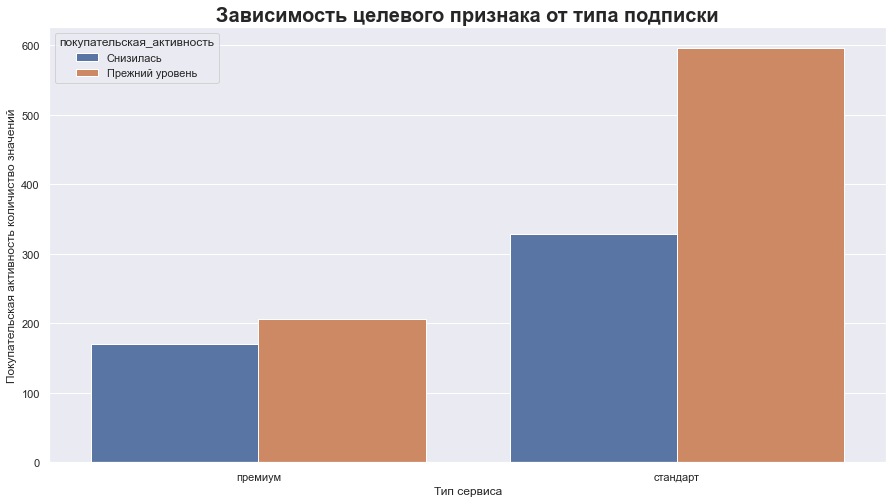

In [34]:
countplot_creator(market_file_df,
                  'тип_сервиса',
                  'покупательская_активность',
                  'Зависимость целевого признака от типа подписки',
                  'Тип сервиса',
                  'Покупательская активность количиство значений'
)
    

Тут видна инетесная закономерность - подписка "премиум" не сильно удерживает пользователей. Количество пользователей чья активность снизилась примерно равно количеству пользователей чья активность осталась на прежнем уровне. Пользователи с типом подписки "стандарт" чаще остаются с прежней активностью, пользователей чья активность снизилась примерно в два раза меньше, чем пользователей чья активность на прежнем уровне, но и выборка таких пользователей значительно больше.

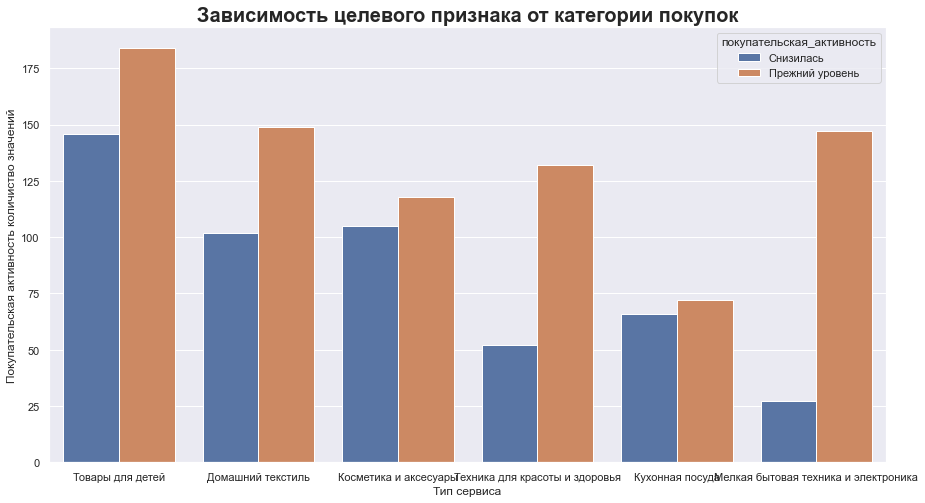

In [35]:
countplot_creator(market_file_df,
                  'популярная_категория',
                  'покупательская_активность',
                  'Зависимость целевого признака от категории покупок',
                  'Тип сервиса',
                  'Покупательская активность количиство значений'
)
    

Больше всего пользователей которые покупают товары для детей, у этой же категории пользователей самый большой процент пользователей со снижением покупательской активности - она составляет достаточно большую часть от общего числа покупателей этой категории. Такая же ситуация с покупателями домашнего текстиля, косметики и аксессуаров и кухонной посуды. Остальные категории (техника для красоты и здоровья и мелкая бытовая техника и электроника) имеют нормальное отношение пользователей со снижением активности к пользователям с активностью отсавшейся на прежнем уровне - именно этих пользователей нужно будет постараться удержать.

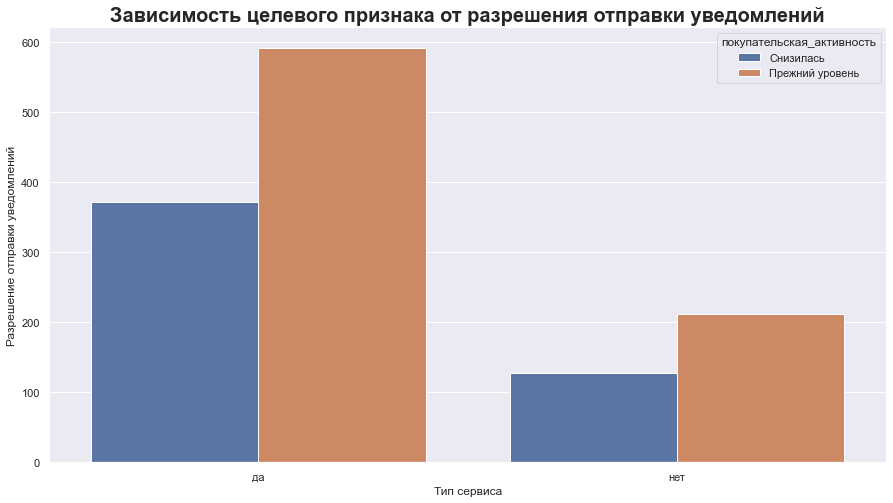

In [36]:
countplot_creator(market_file_df,
                  'разрешить_сообщать',
                  'покупательская_активность',
                  'Зависимость целевого признака от разрешения отправки уведомлений',
                  'Тип сервиса',
                  'Разрешение отправки уведомлений'
)
    

Большинство польователей обоих категорий остаются с прежним уровнем активности, но у пользователей с заперщенной отправкой уведомлений соотношение пользователей со сниженной активностью к пользователям с прежним уровнем активности хуже, чем у пользователей с разрешенной отправкой уведомлений.

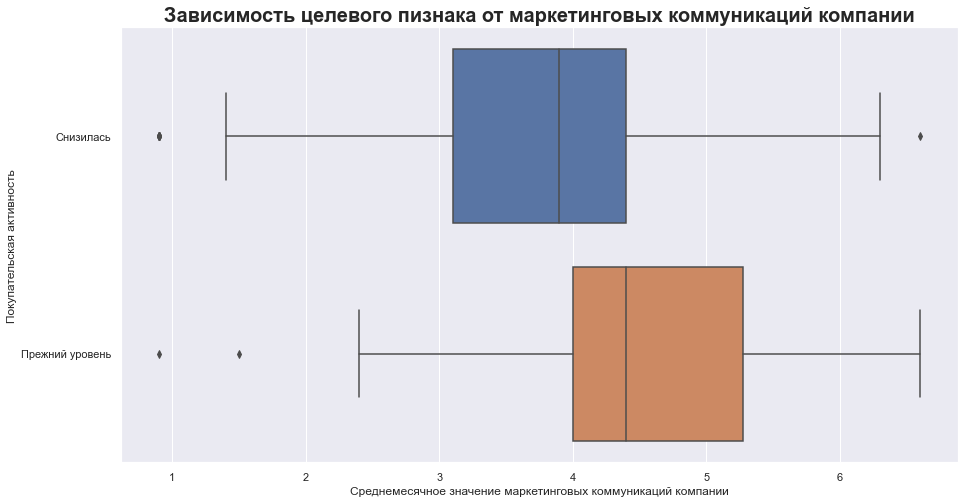

In [37]:
boxplot_creator(market_file_df,
                'маркет_актив_6_мес',
                'покупательская_активность',
                'Зависимость целевого пизнака от маркетинговых коммуникаций компании',
                'Среднемесячное значение маркетинговых коммуникаций компании',
                'Покупательская активность' 
)

Тут зависиомать выглядит естесственно и просто, чем больше среднемесячное значение марекетинговых коммуникаций, тем больше шанс, что активность пользователя не снизится, хотя разница не очень большая и выбросы есть у обоих категорий.

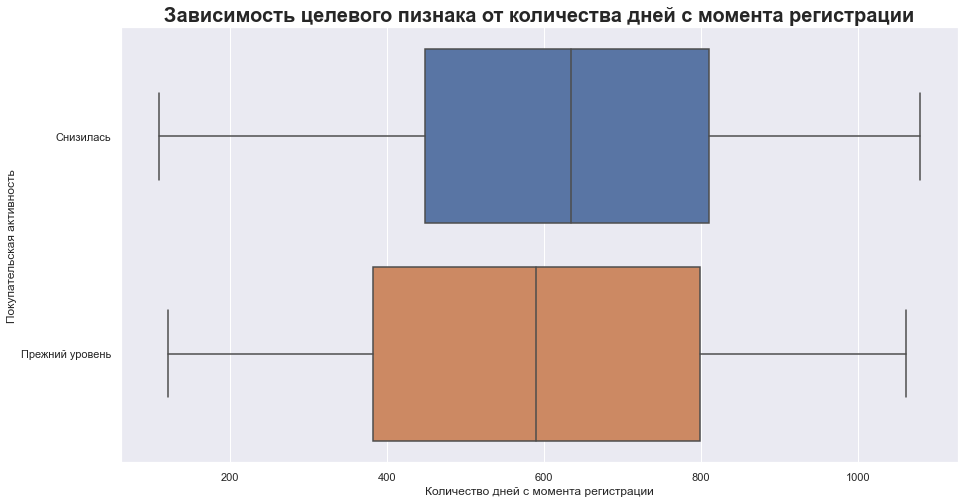

In [38]:
boxplot_creator(market_file_df,
                'длительность',
                'покупательская_активность',
                'Зависимость целевого пизнака от количества дней с момента регистрации',
                'Количество дней с момента регистрации',
                'Покупательская активность' 
)

Судя по этим графикам снижение пользовательской активности никак не зависит от того как давно пользователи зарегистрировались в маназине.

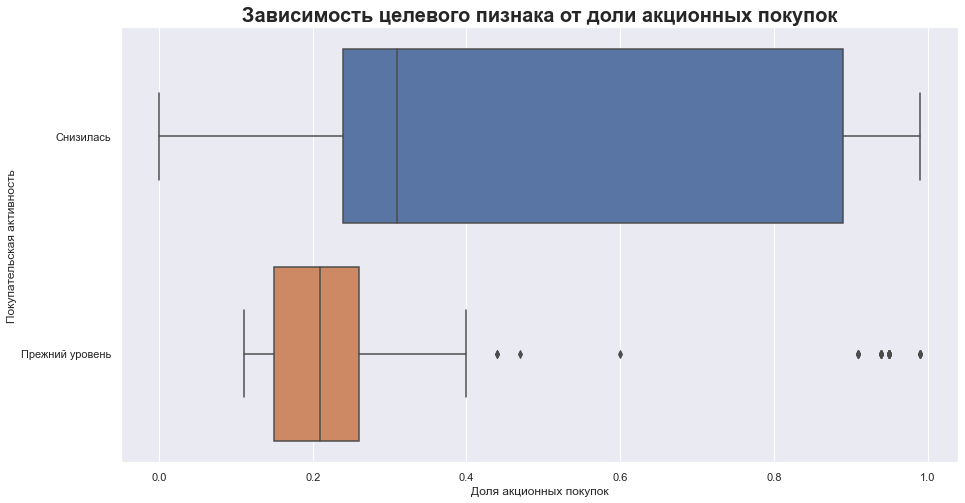

In [39]:
boxplot_creator(market_file_df,
                'акционные_покупки',
                'покупательская_активность',
                'Зависимость целевого пизнака от доли акционных покупок',
                'Доля акционных покупок',
                'Покупательская активность' 
)

У большинства пользователей с низкой долей акционных покупок остается прежний уровень подписки и пользователи с прженим уровнем активности и высокой долей акционных покупок на графике отмечаны как выбросы. Пользователи уровень активности которых снизился могут иметь любую долю акционных покупок, но большинство из них имеют обычную долю акционных покупок.

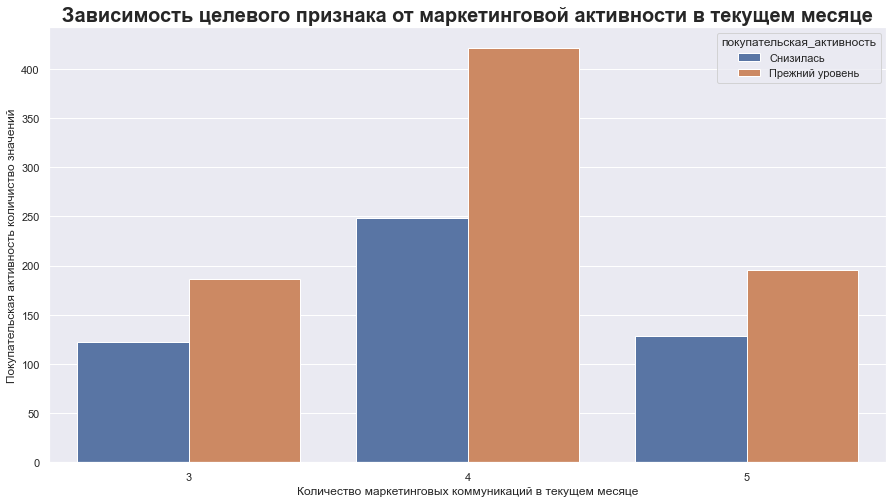

In [40]:
countplot_creator(market_file_df,
                  'маркет_актив_тек_мес',
                  'покупательская_активность',
                  'Зависимость целевого признака от маркетинговой активности в текущем месяце',
                  'Количество маркетинговых коммуникаций в текущем месяце',
                  'Покупательская активность количиство значений'
)
    

Все данные распределены примерно одинаково, просто большинству польозвателей было проведено 4 маркетинговых активности в текущем месяце.

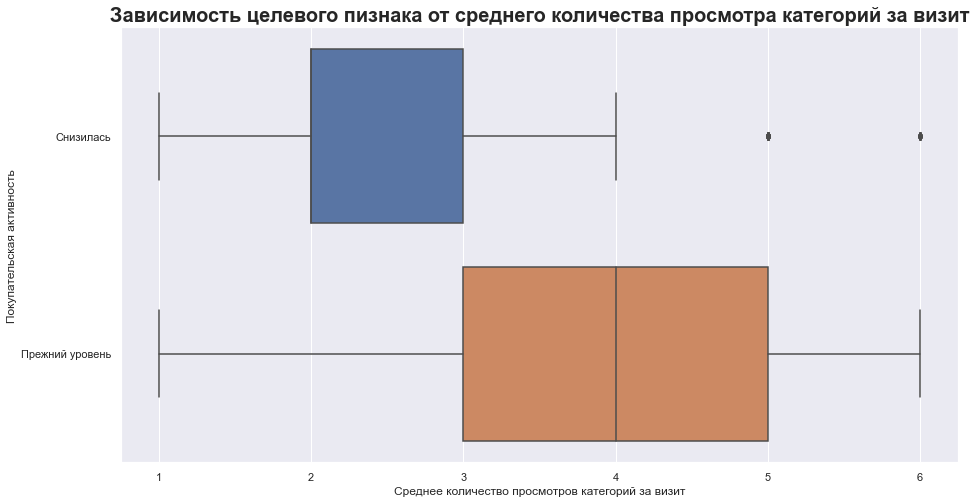

In [41]:
boxplot_creator(market_file_df,
                'средний_просмотр_категорий_за_визит',
                'покупательская_активность',
                'Зависимость целевого пизнака от среднего количества просмотра категорий за визит',
                'Среднее количество просмотров категорий за визит',
                'Покупательская активность' 
)

Тут закономерность тоже вполне очевидна, чес больше категорий за визит смотрит пользователь, тем больше шанс, что его пользовательская активность останется на прженем уровне.

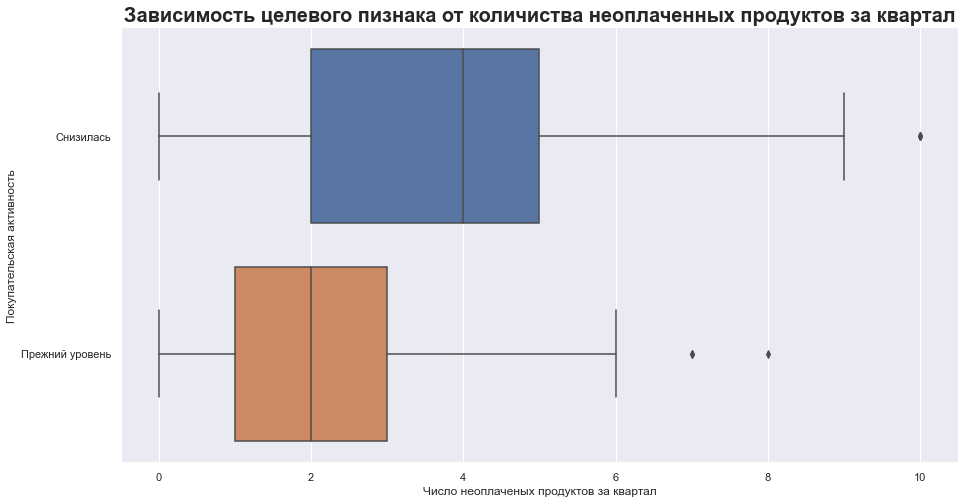

In [42]:
boxplot_creator(market_file_df,
                'неоплаченные_продукты_штук_квартал',
                'покупательская_активность',
                'Зависимость целевого пизнака от количиства неоплаченных продуктов за квартал',
                'Число неоплаченых продуктов за квартал',
                'Покупательская активность' 
)

Тут тоже все просто и логично, чем меньше у пользователя отложенных и неоплаченых товаров - тем меньше шанс, что активность пользоватлея снизится, так как он чаще всего покупает те товары, которые ему нравятся.

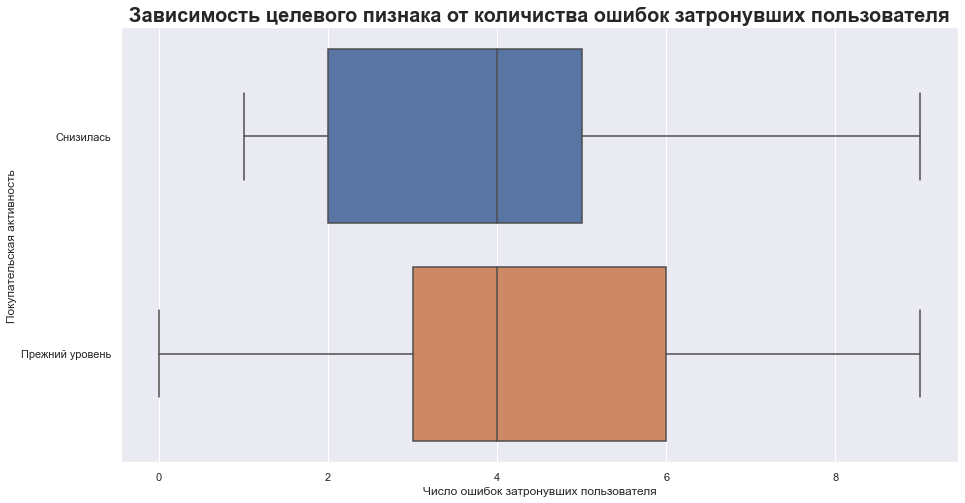

In [43]:
boxplot_creator(market_file_df,
                'ошибка_сервиса',
                'покупательская_активность',
                'Зависимость целевого пизнака от количиства ошибок затронувших пользователя',
                'Число ошибок затронувших пользователя',
                'Покупательская активность' 
)

Судя по графикам можно сказать, что пользователи почти не обращают внимания на то, что на сайте возникают какие-либо ошибки, благо их не много. Снижения уровня пользователя почти никак не зависит от этого параметра.

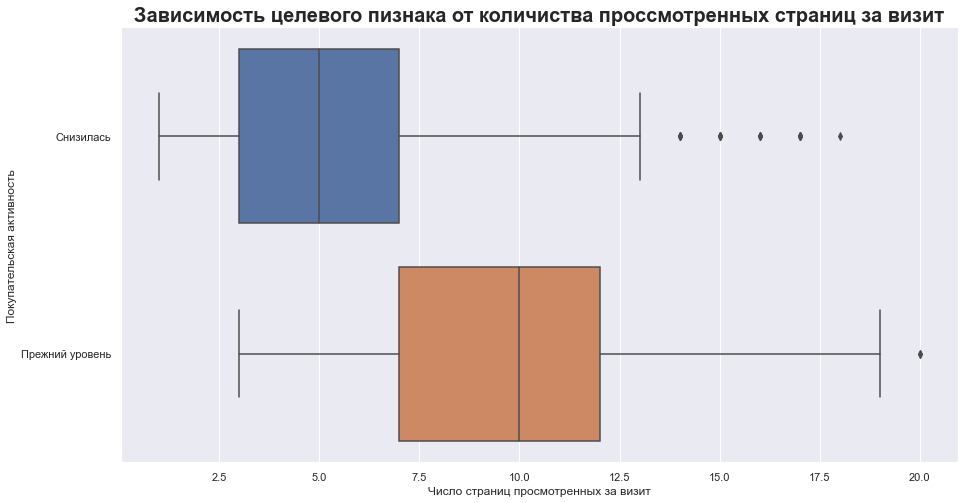

In [44]:
boxplot_creator(market_file_df,
                'страниц_за_визит',
                'покупательская_активность',
                'Зависимость целевого пизнака от количиства проссмотренных страниц за визит',
                'Число страниц просмотренных за визит',
                'Покупательская активность' 
)

Тут тоже все логично, чем больше пользователь просматривает страниц за визит - тем больше шанс, что его пользовательская активность останется на прежнем уровне. Это логично, потому что это показват уровень заинтересованности польователя.

### market_monye_df

In [45]:
profile_market_money_df

В этом датафрейме необходимо изучить только столбец **выручка** 
- Распределение похоже на нормальное с небольшим смещением влево - это говорит о том, что пользователи чаще тратят чуть меньше.
- Минимальное значение равно **2758.7**, а максимальное **7799**
- Чаще всего встречается значение примерно равное **4729**
- Медианное значение равно **4959** и среднее примерно равно **5007**
- Большинстов значений меньше чем **5363**

### market_time_df

In [46]:
profile_market_time_df

В этом датафрейме необходимо изучить только столбец **минут**
- Распределение выглядит как нормальное.
- Минимальное значение равно **4**, а максимальное **23**
- Чаще всего встречается значение примерно равное **255**
- Медианное значение равно **13** и среднее примерно равно **13**
- Большинстов значений меньше чем **16**

### money_df

In [47]:
profile_money_df

В этом датафрейме необходимо изучить только столбец **прибыль**
- Распределение выглядит как нормальное.
- Минимальное значение равно **0.86**, а максимальное **7.43**
- Чаще всего встречается значение примерно равное **3.98**
- Медианное значение равно **4.04** и среднее примерно равно **4**
- Большинстов значений меньше чем **4.67**

### Вывод по исследовательскому анализу.

Во время исследовательского анализа были изучены все столбцы из всех датафреймов, по данным пользователей, которые проявляли покупательскую активность не менее трех месяцев (таких пользователей большинство). В данных было обнаруженно только одно аномальное значение. Все распределения близки к нормальному. А распределение категориальных признаков соответствует примерным ожиданиям и реальности.

Были изучены распределения основных параметров относительно целевого признака.


## Объединение датафреймов

В этом пункте необходимо объединить датафреймы market_file.csv, market_money.csv, market_time.csv. А данные о прибыли из файла money.csv при моделировании нам не понадобятся. Объединять будем только с темо пользователями покупательская активность которых не менее трех месяцев, потому что данные о неактивных пользователях уже никак не помогут нам при моделировании

In [48]:
market_money_df.head()

,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [49]:
market_time_df.head()

,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдущий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдущий_месяц,12
4,215350,текущий_месяц,13


In [50]:
uni_mm1 = market_money_df.pivot_table(index=['id'], columns=['период'], values=['выручка']).query('id in @active_customers_id')
uni_mm1.columns = [
    'выручка_предыдущий_месяц',
    'выручка_препредыдущий_месяц',
    'выручка_текущий_месяц'
]
uni_mm1.head()

,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц
id,,,
215349,5216.0,4472.0,4971.6
215350,5457.5,4826.0,5058.4
215351,6158.0,4793.0,6610.4
215352,5807.5,4594.0,5872.5
215353,4738.5,5124.0,5388.5


In [51]:
market_file_df = market_file_df.merge(uni_mm1, on='id')
market_file_df.shape[0]

1296

In [52]:
uni_mm2 = market_time_df.pivot_table(index=['id'], columns=['период'], values=['минут']).query('id in @active_customers_id')
uni_mm2.columns = [
    'минуты_предыдущий_месяц',
    'минуты_текущий_месяц'
]
uni_mm2.head()

,минуты_предыдущий_месяц,минуты_текущий_месяц
id,,
215349,12,10
215350,8,13
215351,11,13
215352,8,11
215353,10,10


In [53]:
market_file_df = market_file_df.merge(uni_mm2, on='id')
market_file_df.shape[0]

1296

In [54]:
market_file_df.head()

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минуты_предыдущий_месяц,минуты_текущий_месяц
0,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10
1,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13
2,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13
3,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11
4,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10


Все датафреймы объединены.

### Вывод по объединению таблиц

Из-за того, что были даны датафреймы разной размерности объеденение всех этих таблиц в одну оказалось нетривиальной задачей, но она была реализована при помощи небольшой махинации со сводными таблицами.

## Корреляционный анализ

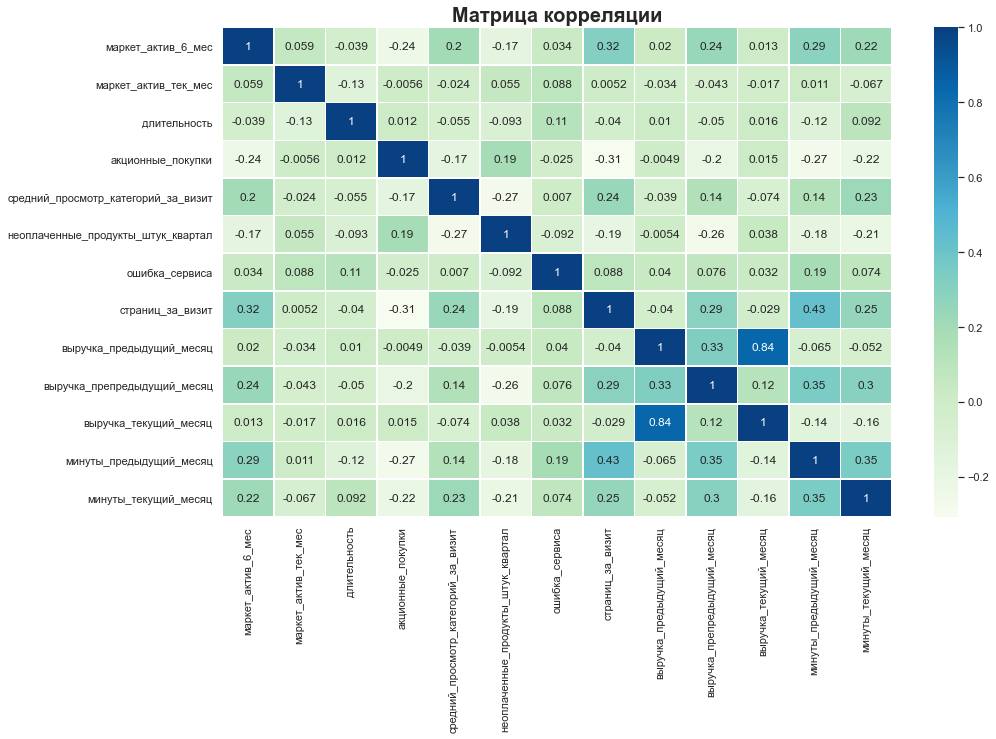

In [55]:
numeric_cols = list(market_file_df.select_dtypes(exclude='object').columns)
numeric_cols.remove('id')
heatmap_corr_creator(market_file_df, numeric_cols, 'Матрица корреляции')

Сильно корреллирующих значений в матрице нет, поэтому мультиколлениарность в данных отсутствует.

Данные могут быть распределены по сетке из-за их грубого округления, но на самом деле в них можно разгледеть некое подобие линейной зависимость. Только она не на столько сильно, что может как-либо ухудшить результаты нашей модели.

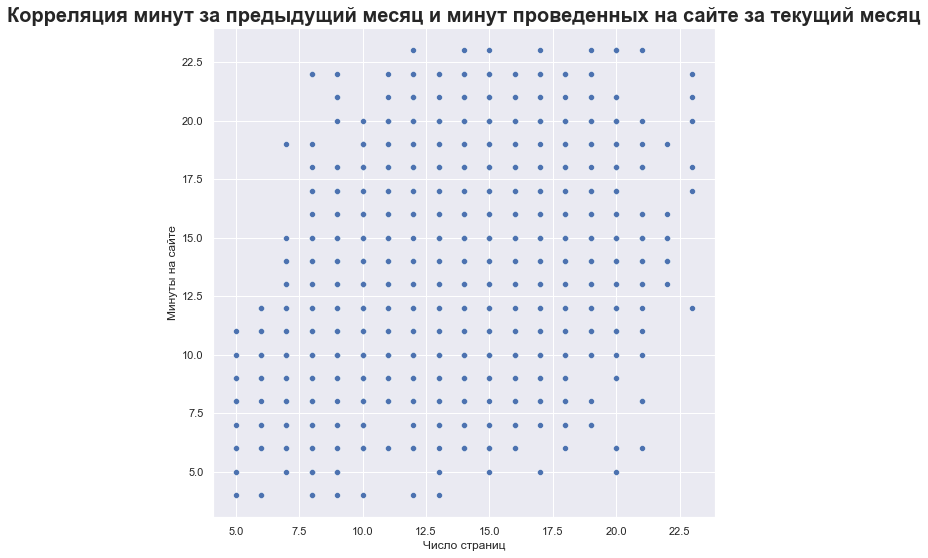

,минуты_текущий_месяц,минуты_предыдущий_месяц
минуты_текущий_месяц,1.000000,0.349477
минуты_предыдущий_месяц,0.349477,1.000000


In [56]:
scatterplot_creator(market_file_df,
                    'минуты_предыдущий_месяц',
                    'минуты_текущий_месяц',
                    'Корреляция минут за предыдущий месяц и минут проведенных на сайте за текущий месяц' ,
                    'Число страниц',
                    'Минуты на сайте',
)

Данные так же распределены по сетеке, но это потосу, что значение минут записано в целых числах. Тоже если бы меня попросили провести линию регрессии, от руки я бы спокойно это сделал, но у значений слишком большой разброс, поэтому говорить о высокой корреляции не приходится.

<Figure size 1080x1080 with 0 Axes>

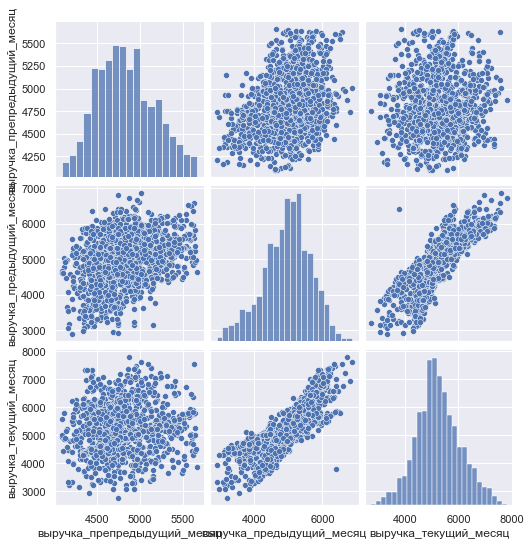

In [57]:
sns.set()
plt.figure(figsize=(15,15))
sns.pairplot(market_file_df, vars=['выручка_препредыдущий_месяц', 'выручка_предыдущий_месяц', 'выручка_текущий_месяц'])


Трудно сказать почему происходит так, что сильная корреляция только у текущего и предыдущегом месяца, но это не вызывает мультиколлинеарность в данных, потому что все-таки коэффициент корреляции недостаточно большой.

### Вывод по корреляционному анализу

Особых проблем с данными обнаружено не было, резюмируя:
- В данных не присутствовала мультиколлениарность, сильго коррерировали всего два значения, но мультиколлениарность они не вызывали
- Была изучена похожая ситуация с минутами проведенными на сайте, но в этих данных слишком большой разброс, поэтому корреляции между ними нет

Теперь данные полностью готовы к моделированию.

## Создание пайплайнов

Для начала нужно определиться какую метрику будем использовать. Нам необходимо определить пользоватлей, активность которых снизится в течении трех ближайших месяцев - в этом случае тяжело сказать, какая ошибка (первого или второго рода) для нас более критична. Дисбаланс класов не такой большой, поэтому не вижу особого смысла использовать метрику f1-score, хватит обычного accuracy, опять же потому, что нам важна общая точность модели.

Еще раз посмотрим на данные, чтобы определиться какие инструменты нам нужны.

In [58]:
market_file_df.head()

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минуты_предыдущий_месяц,минуты_текущий_месяц
0,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10
1,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13
2,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13
3,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11
4,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10


Я буду испльзовать OneHotEncoder для столбцов "тип_сервиса" и "разрешить_сообщать". Для столбца "популярная_категория" я буду использовать OrdinalEncoder. Для количиственных данных буду использовать StandartScaler. 

Нужно удалить стобец id, он никак не поможет наи при моделировании.

In [59]:
df_full = market_file_df.drop('id', axis=1)
df_full['покупательская_активность'] = df_full['покупательская_активность'].apply(lambda x: 1 if x=='Снизилась' else 0)
df_full.head()


,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минуты_предыдущий_месяц,минуты_текущий_месяц
0,1,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.6,12,10
1,1,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.4,8,13
2,1,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.4,11,13
3,1,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.5,8,11
4,1,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.5,10,10


Теперь можно переходить к созданию пайплайна

In [60]:
RANDOM_STATE = 42
TEST_SIZE = 0.25


X_train, X_test, y_train, y_test = train_test_split(
    df_full.drop(['покупательская_активность'], axis=1),
    df_full['покупательская_активность'],
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE,
    stratify = df_full['покупательская_активность']
)


X_train['популярная_категория'].unique()

array(['Мелкая бытовая техника и электроника',
       'Техника для красоты и здоровья', 'Кухонная посуда',
       'Товары для детей', 'Домашний текстиль', 'Косметика и аксесуары'],
      dtype=object)

In [61]:
ohe_col = ['тип_сервиса', 'разрешить_сообщать']
ord_col = ['популярная_категория']
num_col = list(
    df_full.drop(
        ['тип_сервиса', 'разрешить_сообщать', 'популярная_категория', 'покупательская_активность'],
        axis=1)
    .columns
)
num_col

['маркет_актив_6_мес',
 'маркет_актив_тек_мес',
 'длительность',
 'акционные_покупки',
 'средний_просмотр_категорий_за_визит',
 'неоплаченные_продукты_штук_квартал',
 'ошибка_сервиса',
 'страниц_за_визит',
 'выручка_предыдущий_месяц',
 'выручка_препредыдущий_месяц',
 'выручка_текущий_месяц',
 'минуты_предыдущий_месяц',
 'минуты_текущий_месяц']

In [62]:
ohe_pipe = Pipeline(
    [
     ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False))
    ]
)

ord_pipe = Pipeline(
    [
     ('ord',  OrdinalEncoder(
                categories=[
                    ['Мелкая бытовая техника и электроника', 
                     'Техника для красоты и здоровья', 
                     'Кухонная посуда',
                     'Товары для детей',
                     'Домашний текстиль',
                     'Косметика и аксесуары'
                    ], 
                    
                ]
            )
        ),
    ]
)

data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_col),
     ('ord', ord_pipe, ord_col),
     ('num', MinMaxScaler(), num_col)
    ], 
    remainder='passthrough'
)

pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])

Пайплайн создан.

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  ['тип_сервиса',
                                                   'разрешить_сообщать']),
                                                 ('ord',
                                                  Pipeline(steps=[('ord',
                                                                   OrdinalEncoder(categories=[['Мелкая '
                                                                   

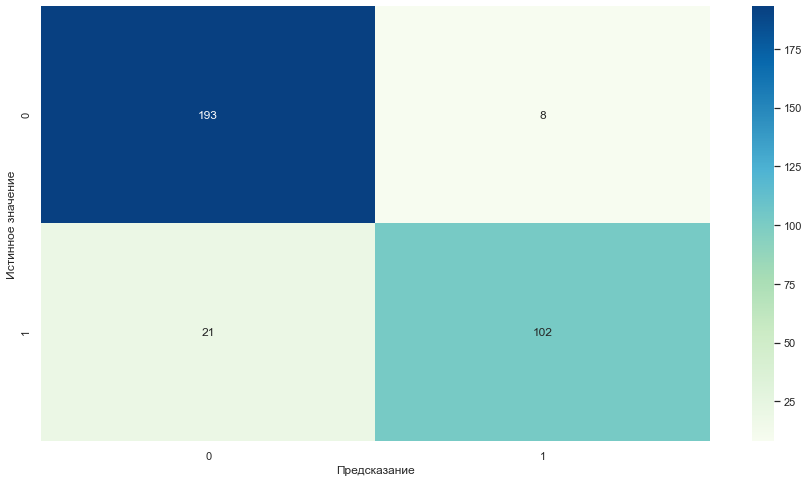

In [77]:
param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 6),
        'models__max_features': range(2, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    },
    
    # словарь для модели KNeighborsClassifier() 
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2, 7),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']   
    },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE, 
            solver='liblinear', 
            penalty='l1'
        )],
        'models__C': range(2, 9),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    }
]

randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    cv=5,
    scoring='accuracy',
    random_state=RANDOM_STATE,
    n_jobs=-1
)
randomized_search.fit(X_train, y_train)


print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', randomized_search.best_score_)

y_test_pred = randomized_search.predict(X_test)

cm = confusion_matrix(y_test, y_test_pred)
sns.set()
plt.figure(figsize=(15,8))
sns.heatmap(cm, annot=True, fmt='d', cmap='GnBu')
plt.ylabel('Истинное значение')
plt.xlabel('Предсказание'); 

print(f'Метрика accuracy на тестовой выборке: {accuracy_score(y_test, y_test_pred)}')

### Вывод по работе модели

Лучшкей моделью оказалась модель LogisticRegression (логистоическая регрессия) с гиперпараметрами:
- C=5
- penalty=l1

Результат по метрикам немного удивил - лучшая метрика на тренировочной выборке примерно равна **0.86** - это хороший результат, но метрика на тестовой выборке еще выше! Она равна приблизительно **0.91** - это очень высокий результат особенно для тестовой выборки. По матрице ошибок тоже можно сказать, что результат неплохой, часть ошибок первого и второго рода достаточно мала относитьельно верных ответов.

## Анализ важности признаков

Для анализа важности признаков будем использовать метот beeswarm из библиотеки shap, это может показаться лишей работой, но я считаю важным посмотреть какие признаки и как влияют на то снизится ли покупательская или останется на прежнем уровне, а не просто узнать какой признак ильнее всего влияет на решение модели. SelektKbest использовать не будем, потому что полиномильных признаков я не делал и не вижу особого смысла добавлять их.

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


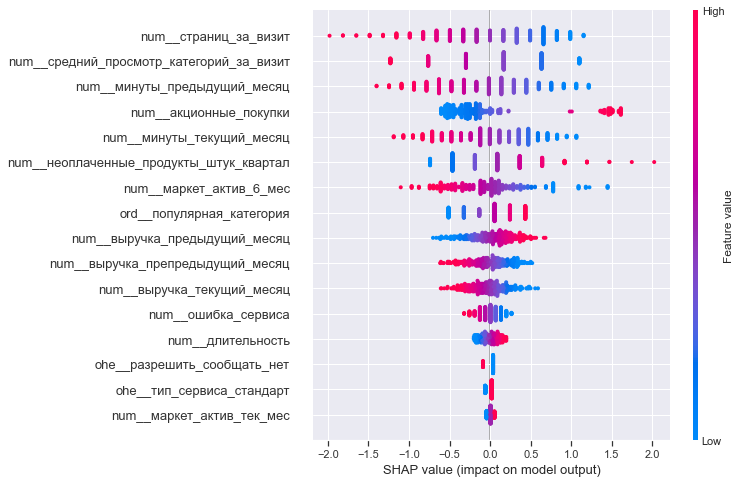

In [64]:
X_test_new = randomized_search.best_estimator_['preprocessor'].fit_transform(X_test)
X_test_new = pd.DataFrame(X_test_new, columns = randomized_search.best_estimator_['preprocessor'].get_feature_names_out())

explainer = shap.LinearExplainer(randomized_search.best_estimator_['models'], X_test_new)
shap_values = explainer(X_test_new)
shap.plots.beeswarm(shap_values, max_display=17) 

### Вывод по анализу важности признаков

- Сильнее всего на результат модели влияет признак ***страниц_за_визит***, по графику видно чем больше страниц за визит смотрит отдельный пользователь тем больше шанс, что его пользовательская активность останется на прежнем уровне. Это выглядит вполне логично, ведь чем дольше пользователь выбирает как-либо товар, тем больше шанс, что он его приобретет.-
- Со средним просмотром за визит примерно такая ситуация и ее объяснение практически аналогично первому
- С минутами все тоже понятно, чем больше пользователь проводит времени на сайте тем больше вероятность того, что его пользовательская активность останется на прежнем уровне.
- С акционными покупками ситуация интереснее, но если задуматься она выглядит очень правдеподобно. Чем больше пользователь покупает по акциям - тем меньше шанс, что это просто не тот человек который отлавливает акции и скидки. Для большего понимания стоит привети пример: когда в интернет магазине проходит какая-либо акция или появляется кака-либо хорошая скидка на продукт, множество людей покупают его на этом сайте, потому что это выгодно, но они как не были пользователями этого магазина, так и в большенстве своем (конечно не все) ими не станут.
- С неоплачеными продуктами тоже все просто. Чем больше у пользователя неоплаченых покупок, тем больше шанс того, что его покупательская активность снизится - это звучит логично.
- C маркетинговой активностью все тоже понятно, чем больше ее было в течении полугода, тем больше шанс, что пользователь продолжит пользоваться продуктом.
- Популярная категория тоже имеет свой вес, например если человек покупал какую либо технику в этом магазине - тем больше шанс, что его пользовательская активность останется на прежнем уровне, а вот пользователи которые покупают домашний текстиль или косметику с аксесуарами с большей вероятностью будут уходить с этого магазина.
- Так же инетерсная ситуация возникает с выручкой от пользователя за месяц, их влияение на модель примерно одинаковое и достаточно слабое, но все же сранно, что чем большу прибыл пользователь принес в пердыдущем месяце тем больше его вероятность того, что его активность снизится, а с остальными параметрами выручки ситуация обратная. Возможно это связано с проведением как-то акции в прошлом месяце, возмжоно с тем, что они покупали особые категории товаров, которые не нужно покупать каждый месяц, может быть из магазина в тот месяц ушли какие-либо продавцы или с ними закончился контракт - это уже тяжело проверить если не связываться с представителями компании, а может просто это какая-то особенность модели, нужно будет рассмотреть это подробнее
- Остальные данные не так сильно влият на модель, единственное можно кратко дополнить, что пользователи, которые показали большУю прибыль для магазина в предыдущем месяце почему-то склонны к тому чтобы покидать данный магазин, возможно это связано с покупаемыми категорями(например из этого магазна месяц назад ушел какой-то популярный бренд косметики), пользователи которые купиши премиум подписку чаще остаются с высокой польозвательской активностью. Пользователм которые дали согласие на отправку им уведомленей с большей вероятностью останутся с прежним уровнем активности. Однако напомню еще раз, что эти параметры уже слабо влияют на результат модели.

Анализ важности признаков разъяснил многи аспекты, которые можно использовать для создания акций и предложений для возврата старых пользователей, набора новых и удержания имеющихся. Все признаки влияют на модель адекватно и показывают правдеподобный результат.

## Сегментация покупателей

Я бы выделил несколько категорий покупателей
- Первая и самая интересная для исследования: покупатели с высокой долей акционных покупок и снижающейся покупательской активностью. Скорее всего это вызвано тем, что магазином пользуются назовем их "ловци акций", которые просто ищуют товары по скидке. Можно рассмотреть их любимые категории и предлагать им скидки на них - это должно им понравится и чаще пользоваться магазином.
- Вторая: пользователи, которые принесли большую прибыль магазину в предыдущем месяце, но их активность склонна к снижению. Тут, как я уже говорил выше, тоже есть несколько вариантов: либо в прошлом месяце проходила какая-то акция например была "черная пятница"; может быть что они (пользователи) покупали категории товаров, которые не нужно обновлять каждый месяц; может быть из магазина в тот месяц ушли какие-либо продавцы или с ними закончился контракт - это уже тяжело проверить если не связываться с представителями компании; может быть это просто особенность работы модели - это тоже тяжело проверить.

In [65]:
model = randomized_search.best_estimator_
result = pd.DataFrame(model.predict_proba(X_test)[:,1], columns = ['вероятность_снижения'], index=X_test.index)
proba_df = X_test.merge(result, left_index=True, right_index=True)
proba_df = proba_df.merge(money_df, left_index=True, right_index=True)
proba_df.head()

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минуты_предыдущий_месяц,минуты_текущий_месяц,вероятность_снижения,id,прибыль
809,стандарт,да,4.1,4,606,0.15,Техника для красоты и здоровья,6,1,4,12,3973.0,4912.0,3289.2,16,17,0.011287,216157,3.95
302,премиум,нет,1.4,4,684,0.94,Товары для детей,3,6,1,6,3548.0,4656.0,4170.7,11,9,0.987965,215650,2.54
955,премиум,да,3.3,4,488,0.13,Домашний текстиль,4,2,8,10,5444.0,4565.0,6335.8,20,11,0.085930,216303,4.69
149,премиум,да,3.5,3,1057,0.35,Домашний текстиль,4,3,5,6,6604.0,4993.0,6758.7,9,9,0.794161,215497,4.17
582,стандарт,нет,5.5,4,147,0.99,Мелкая бытовая техника и электроника,1,2,3,7,5090.0,4451.0,5773.8,15,18,0.532404,215930,2.77


### Покупатели с высокой долей акционных покупок

Для начала рассмотрим распределение прибыли и доли акционных покупок.

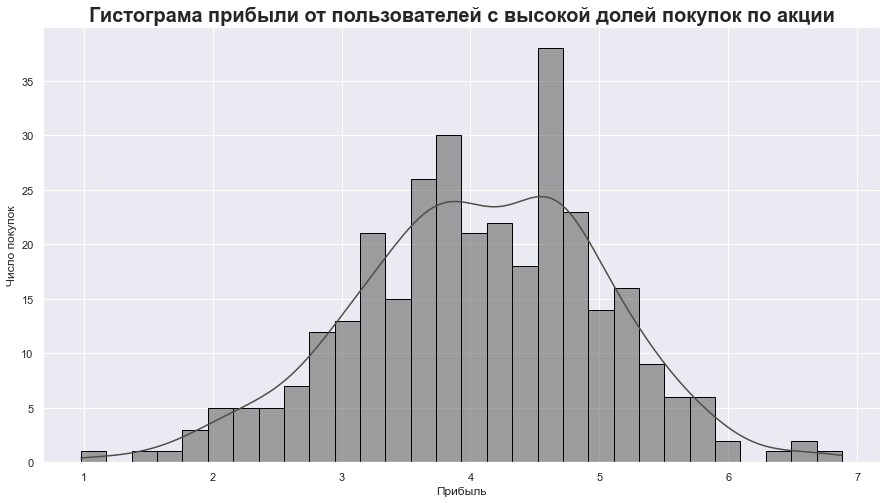

count    324.000000
mean       4.068951
std        0.964250
min        0.980000
25%        3.457500
50%        4.065000
75%        4.690000
max        6.880000
Name: прибыль, dtype: float64

In [66]:
histogram_creator(proba_df,
                  'прибыль',
                  30,
                  'Гистограма прибыли от пользователей с высокой долей покупок по акции',
                  'Прибыль',
                  'Число покупок'
                 )

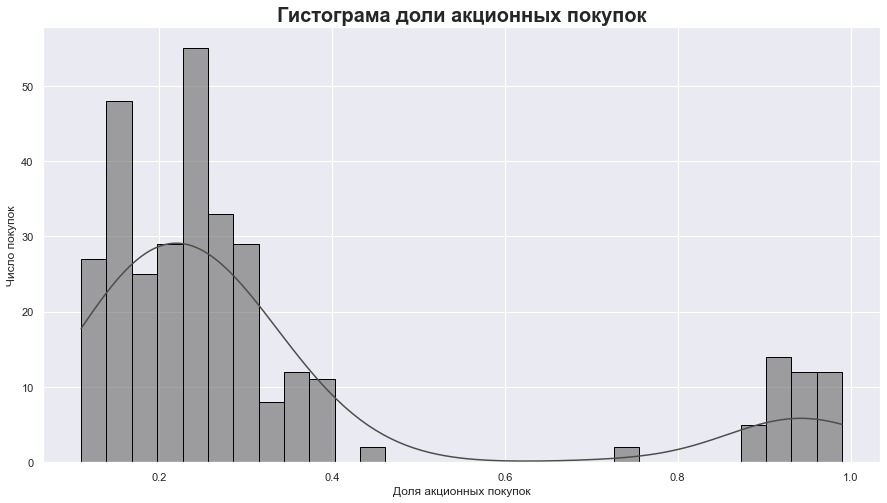

count    324.000000
mean       0.327099
std        0.254989
min        0.110000
25%        0.170000
50%        0.240000
75%        0.310000
max        0.990000
Name: акционные_покупки, dtype: float64

In [67]:
histogram_creator(proba_df,
                  'акционные_покупки',
                  30,
                  'Гистограма доли акционных покупок',
                  'Доля акционных покупок',
                  'Число покупок'
                 )

Приыбль распределена нормально, а вот в акционных покупках есть интерескная особенность данных - пользователи с высокой долей акционных покупок имеют долю оных начиная примерно от 0.85 и между такими пользователями и обычными большой пробел. У большей части пользователей доля акционных покупок не более 0.5, поэтому высокой долей акционных покупок более 0.6 от общего числа данных.

Нужно посмотреть как связана прибыль и доля акционных покупок.

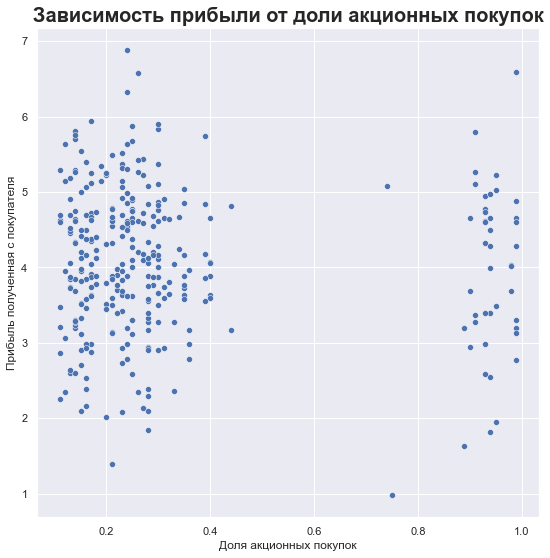

,прибыль,акционные_покупки
прибыль,1.000000,-0.048831
акционные_покупки,-0.048831,1.000000


In [68]:
scatterplot_creator(proba_df,
                    'акционные_покупки',
                    'прибыль',
                    'Зависимость прибыли от доли акционных покупок',
                    'Доля акционных покупок',
                    'Прибыль полученная с покупателя' 
                       )

Ничего необычного, пользователи с высокой долей акционных покупоку приносят примерно такую же прибыль магазину, как и обычные пользователи.

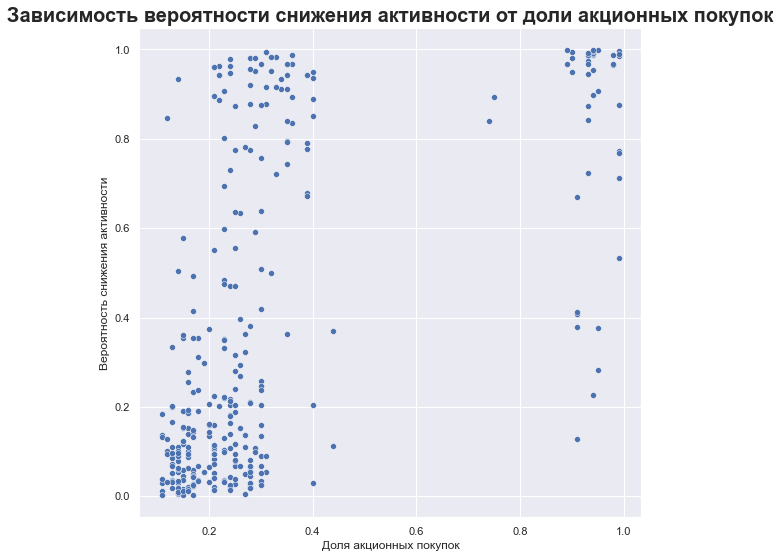

,вероятность_снижения,акционные_покупки
вероятность_снижения,1.000000,0.583637
акционные_покупки,0.583637,1.000000


In [69]:
scatterplot_creator(proba_df,
                    'акционные_покупки',
                    'вероятность_снижения',
                    'Зависимость вероятности снижения активности от доли акционных покупок',
                    'Доля акционных покупок',
                    'Вероятность снижения активности' 
)

По этому графике не то что бы можно сказать, что у пользователей с большой долей акционных покупок вероятность снижения активности больше, потому что этих пользователей примерно столько же сколько и пользователей с обычной долей акционных покупок. Просто эти пользоавтели реже остаются в маназине, как постоянные клиенты, скорее всего они пришли из какого-либо стороннего ресурса (реклама, телеграм канал со скидками и т.д)

Рассмотрим распределения пользователей с большой долей акционных покупоку более детально.

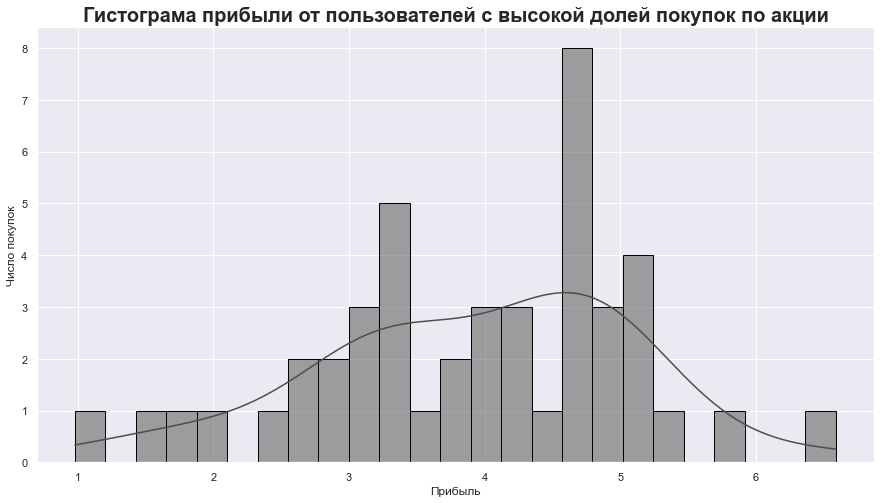

count    45.000000
mean      3.932222
std       1.157994
min       0.980000
25%       3.200000
50%       4.030000
75%       4.740000
max       6.590000
Name: прибыль, dtype: float64

In [70]:
histogram_creator(proba_df.query('акционные_покупки >= 0.6'),
                  'прибыль',
                  25,
                  'Гистограма прибыли от пользователей с высокой долей покупок по акции',
                  'Прибыль',
                  'Число покупок'
                 )

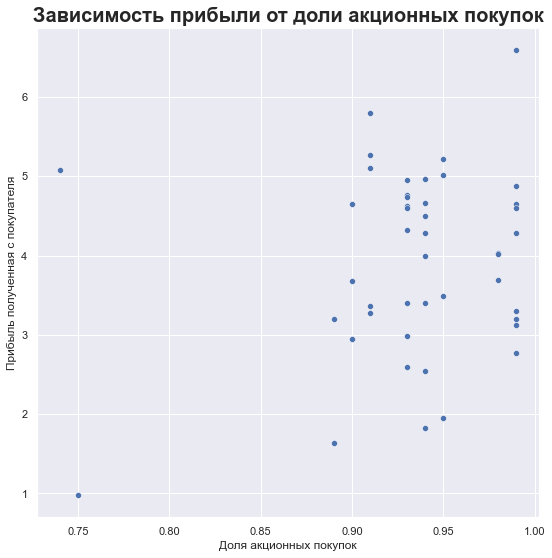

,прибыль,акционные_покупки
прибыль,1.000000,0.186355
акционные_покупки,0.186355,1.000000


In [71]:
scatterplot_creator(proba_df.query('акционные_покупки >= 0.6'),
                    'акционные_покупки',
                    'прибыль',
                    'Зависимость прибыли от доли акционных покупок',
                    'Доля акционных покупок',
                    'Прибыль полученная с покупателя' 
                       )

Судя по полученным графикам пользователи с высокой долей акционных покупок, приносят прибыль примерно равною прибыли полученной от обычных пользователей. Все еще ничего интересного

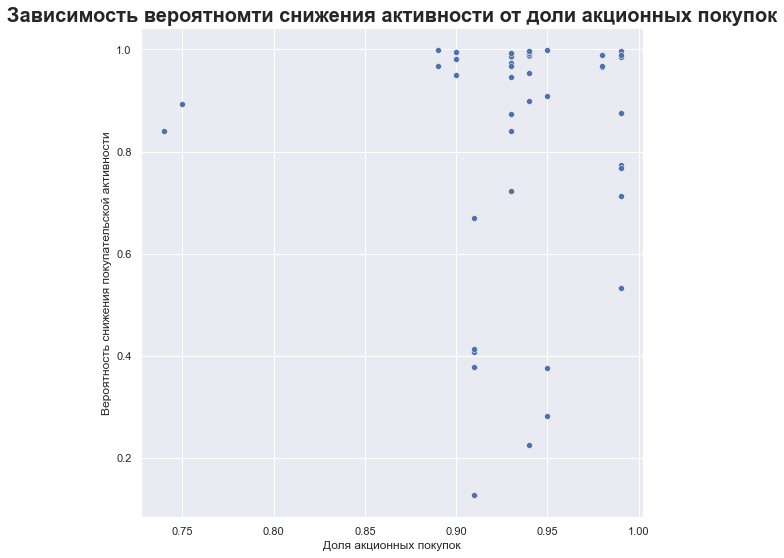

,вероятность_снижения,акционные_покупки
вероятность_снижения,1.00000,0.03421
акционные_покупки,0.03421,1.00000


In [72]:
scatterplot_creator(proba_df.query('акционные_покупки >= 0.6'),
                    'акционные_покупки',
                    'вероятность_снижения',
                    'Зависимость вероятномти снижения активности от доли акционных покупок',
                    'Доля акционных покупок',
                    'Вероятность снижения покупательской активности' 
                    )

Судя по этому графику, пользователи с высокой долей покупок по акции просто реже остаются пользователями маназина. Это позволяет прийти к выводу, что скорее всего это скорее всего присото "охотники за акциями" и единственный способ удержания таких клиентов, который приходит в голову это предлагать им акцию по их люимой категории.

Для того, чтобы придумать как заманить их в магазин (удержать), нужно проверить, может быть такие охотники за акциями имеют любимую категорию.

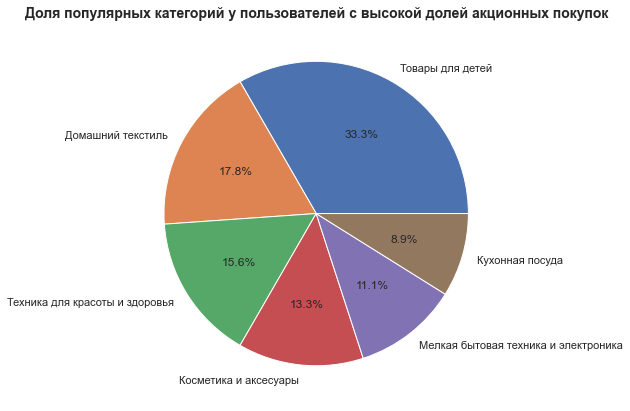

In [73]:
pie_creator(proba_df.query('акционные_покупки >= 0.6'),
            'популярная_категория',
            'Доля популярных категорий у пользователей с высокой долей акционных покупок')

Любимая категория пользователей с высокой долей акционных покупок это "Товары для детей", потом идут три примерно равной по величине категории и на последнем месте "Кухонная посуда". Судя по этому графику у такиз пользоватлей действительно есть любимая категория, и решения для их удержание простое идейно, но трудно реальизуемое. Можно предлагать таким пользователям скидки по тем категориям, которые они чаще берут, но для этого понадобится еще одна модель рекомендательной системы, а это лишние затраты для магазина. Но какое решение будет более выгодным для маназина уже должны решать маркетологи, готовы ли они потратить деньги на разработку модели или же им проще оставить таких пользователей (охотников за акциями в том же положении, что и сейчас).

### Пользователи, которые принесли большую прибыль магазину в предыдущем месяце, но их активность склонна к снижению.

Для начала посмотрим как распределена прибыль за предыдущий месяц

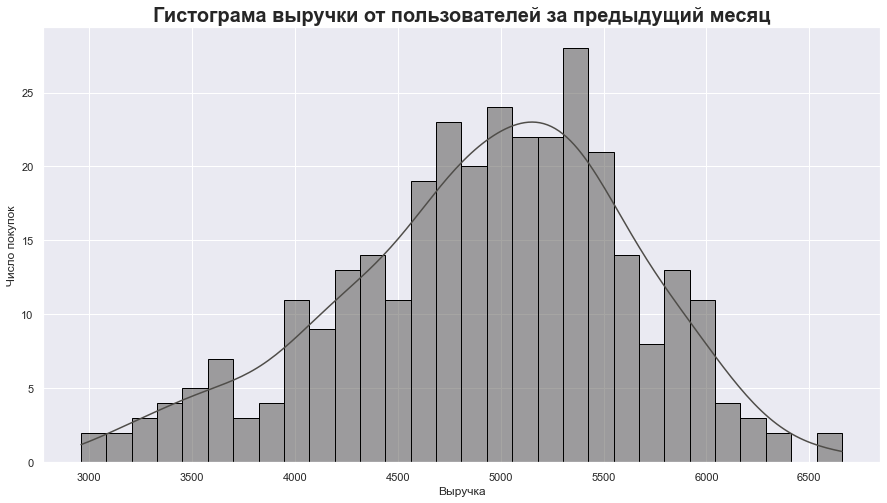

count     324.000000
mean     4924.632716
std       705.928391
min      2960.000000
25%      4481.125000
50%      4997.250000
75%      5418.375000
max      6658.500000
Name: выручка_предыдущий_месяц, dtype: float64

In [74]:
histogram_creator(proba_df,
                  'выручка_предыдущий_месяц',
                  30,
                  'Гистограма выручки от пользователей за предыдущий месяц',
                  'Выручка',
                  'Число покупок'
                 )

Ничего необычного, данные распределены нормально с небольшим смещением вправо.

Посмотрим как зависит вероятность снижения от прибыли за препредыдущий, предыдущий и текущий месяц, чтобы понять выделяется ли как-то какой-либо из месяцов.

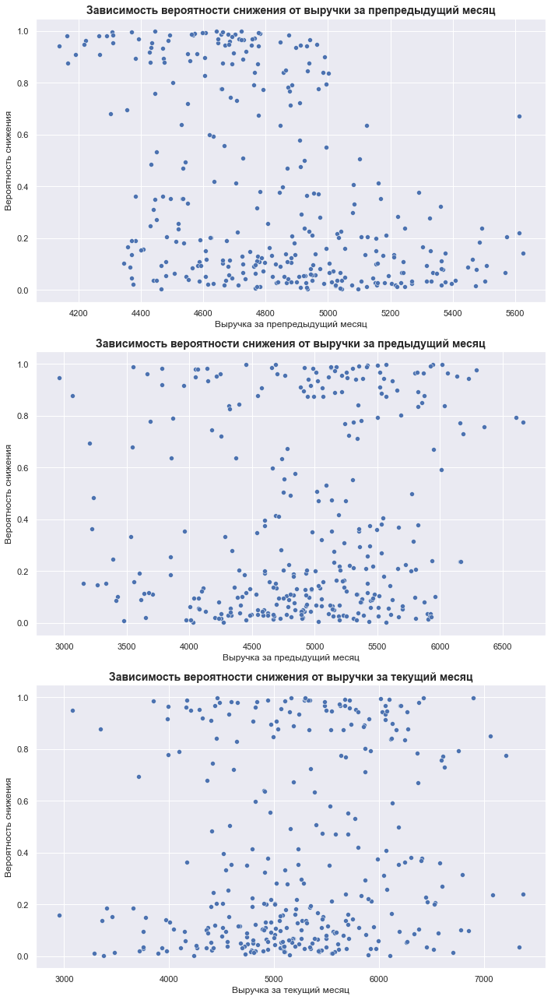

In [75]:
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

sns.scatterplot(x='выручка_препредыдущий_месяц', y='вероятность_снижения', data=proba_df, ax=axes[0])
axes[0].set_title('Зависимость вероятности снижения от выручки за препредыдущий месяц',
                  fontsize=14,
                  fontweight='bold'
)
axes[0].set_xlabel('Выручка за препредыдущий месяц')
axes[0].set_ylabel('Вероятность снижения')

sns.scatterplot(x='выручка_предыдущий_месяц', y='вероятность_снижения', data=proba_df, ax=axes[1])
axes[1].set_title('Зависимость вероятности снижения от выручки за предыдущий месяц',
                  fontsize=14,
                  fontweight='bold'   
)
axes[1].set_xlabel('Выручка за предыдущий месяц')
axes[1].set_ylabel('Вероятность снижения')

sns.scatterplot(x='выручка_текущий_месяц', y='вероятность_снижения', data=proba_df, ax=axes[2])
axes[2].set_title('Зависимость вероятности снижения от выручки за текущий месяц',
                  fontsize=14,
                  fontweight='bold'
)
axes[2].set_xlabel('Выручка за текущий месяц')
axes[2].set_ylabel('Вероятность снижения')

plt.tight_layout()

plt.show()

По графикам не видно никакой необычной зависимости, все столбцы распределены примерно относительно вероятности снижения покупательской активности. 

Теперь проверим, может быть в предыдущем месяце проводилась какая-то акция и была ли она на определенную категорию товаров. Проверим опять же относительно других столбцов.

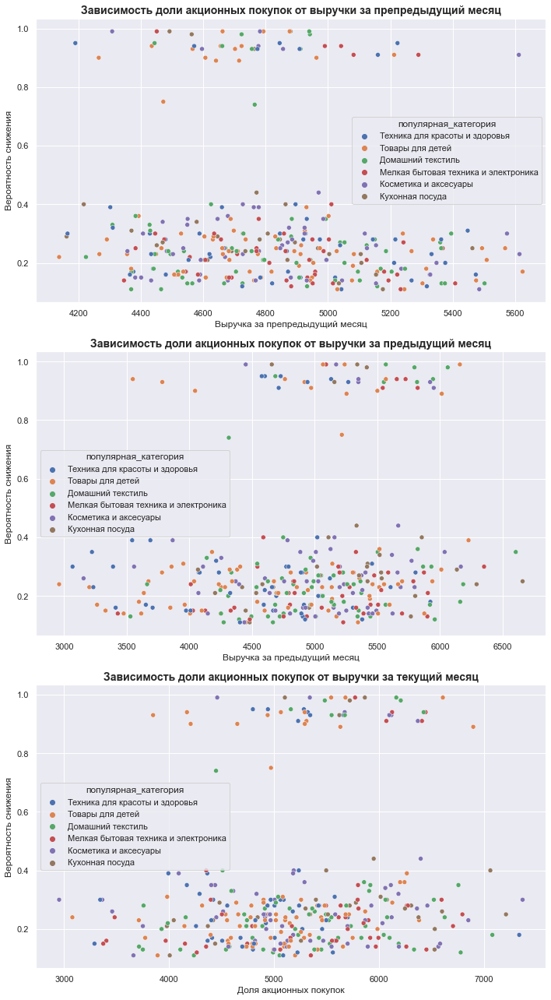

In [76]:
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

sns.scatterplot(x='выручка_препредыдущий_месяц', y='акционные_покупки', data=proba_df, ax=axes[0], hue='популярная_категория')
axes[0].set_title('Зависимость доли акционных покупок от выручки за препредыдущий месяц',
                  fontsize=14,
                  fontweight='bold'
)
axes[0].set_xlabel('Выручка за препредыдущий месяц')
axes[0].set_ylabel('Вероятность снижения')

sns.scatterplot(x='выручка_предыдущий_месяц', y='акционные_покупки', data=proba_df, ax=axes[1], hue='популярная_категория')
axes[1].set_title('Зависимость доли акционных покупок от выручки за предыдущий месяц',
                  fontsize=14,
                  fontweight='bold'   
)
axes[1].set_xlabel('Выручка за предыдущий месяц')
axes[1].set_ylabel('Вероятность снижения')

sns.scatterplot(x='выручка_текущий_месяц', y='акционные_покупки', data=proba_df, ax=axes[2], hue='популярная_категория')
axes[2].set_title('Зависимость доли акционных покупок от выручки за текущий месяц',
                  fontsize=14,
                  fontweight='bold'
)
axes[2].set_xlabel('Доля акционных покупок')
axes[2].set_ylabel('Вероятность снижения')

plt.tight_layout()

plt.show()

Тут тоже ничего необычного, все данные по месяцам распределены примерно одинаково и все акции проводились по разным категориям. 
Проверив отношения по всем столбцам (не стал их остовлять дабы не загружать проект лишней информацией) мне не удалось найти закономерности которая могла бы объянить такое влияние выручки за предыдущий месяц на модель. Остается только предположить:

- Такой результат может быть связан с работой модели и процессами внути нее (маловероятно, но может быть).
- Такой результат может быть связан с внутренними процессами компании или появлениям как-либо магазина конкурета на рынке.

Самым эффективным решением данной проблемы мне кажется таким же, что и для прошлой категории пользователей, т.е. создание рекомендательной системы, которя предлагала бы пользователю товары со скидкой на ее любимую категорию.

### Вывод по сегментации пользователей

Были рассмотрены два сегмента которые сильнее всего влият на результат предсказания модели и вних были найдены следующие закономерности:

- Первая и самая интересная для исследования: покупатели с высокой долей акционных покупок и снижающейся покупательской активностью. Скорее всего это вызвано тем, что магазином пользуются назовем их "ловци акций", которые просто ищуют товары по скидке. Можно рассмотреть их любимые категории и предлагать им скидки на них - это должно им понравится и чаще пользоваться магазином.
- Вторая: пользователи, которые принесли большую прибыль магазину в предыдущем месяце, но их активность склонна к снижению. Тут, как я уже говорил выше, тоже есть несколько вариантов: либо в прошлом месяце проходила какая-то акция например была "черная пятница"; может быть что они (пользователи) покупали категории товаров, которые не нужно обновлять каждый месяц; может быть из магазина в тот месяц ушли какие-либо продавцы или с ними закончился контракт - это уже тяжело проверить если не связываться с представителями компании; может быть это просто особенность работы модели - это тоже тяжело проверить.

***Теперь необходимо придумать персонализированные предложения для выбраных сегментов покупателей.***

- Любимая категория пользователей с высокой долей акционных покупок это "Товары для детей", потом идут три примерно равной по величине категории и на последнем месте "Кухонная посуда". Судя по полученному графику у таких пользоватлей действительно есть любимая категория, и решения для их удержание простое идейно, но трудно реальизуемое. Можно предлагать таким пользователям скидки по тем категориям, которые они чаще берут, но для этого понадобится еще одна модель рекомендательной системы, а это лишние затраты для магазина. Но какое решение будет более выгодным для маназина уже должны решать маркетологи, готовы ли они потратить деньги на разработку модели или же им проще оставить таких пользователей (охотников за акциями в том же положении, что и сейчас)


- Для второй категории все неоднозначно. Проверив отношения по всем столбцам не удалось найти закономерности которая могла бы объянить такое влияние выручки за предыдущий месяц на модель. Остается только предположить:

    - Такой результат может быть связан с работой модели и процессами внути нее (маловероятно, но может быть).
    - Такой результат может быть связан с внутренними процессами компании или появлениям как-либо магазина конкурета на рынке.

    Самым эффективным решением данной проблемы мне кажется таким же, что и для прошлой категории пользователей, т.е. создание рекомендательной системы, которя предлагала бы пользователю товары со скидкой на ее любимую категорию.

# Общий вывод

В результате работы над проектом была проделана большая работа по изучению признаков которые могут помочь развиться или же не "скатиться" бизнесу. Для удобство разработки использовались сторонние библиотеки и функции, инициализация и описание которых находится в пункте **Все функции используемые в проекте**. Резюмируя результаты работы и по каждому этапу:


1. ***Загрузка и знакомство с данными***
    - В значения типа float разделение было заменено с "," на "."
    - Данные в которых вместо "," в качестве разделителя был другой символ были коррыектоно записаны в датфрейм.
    - Серьезных проблем на этапе первичного знакомства с данными обнаружено не было  
2. ***Предобработка данных***
    - Были предоставлены данные достаточно высокого качества. В них не было не пропущеных значений, ни явных/полных дубликатов. Все численные столбцы содержали корректыне данные.
    - Были удалены неявные дубликаты в стобце "тип_сервиса" датафрейма ***market_file_df***
    - Название столбцов были приведены к общему виду (***snake_kase***) 
3. ***Исследовательский анализ данных***
    - Во время исследовательского анализа были изучены все столбцы из всех датафреймов, по данным пользователей, которые проявляли покупательскую активность не менее трех месяцев (таких пользователей большинство).
    - Во время исследовательского анализа были изучены распределения значений относительно целевого признака.
    - В данных было обнаруженно только одно аномальное значение от которго мы избавились.
    - было установлено, что все распределения числовых значений близки к нормальному. А распределение категориальных признаков соответствует примерным ожиданиям и реальности.
    - Более подробное описание результатов по исследованию каждого столбцов датафрейма можно посмотреть на этапе исследовательского анализа.
    - Для пердобработки данных и исследовательского анализа данных использовалась библиотека ydata-profiling
4. ***Объединение датафреймов***
    - Данные были разбиты на датафреймы меньшей размерности по категориям, потому что датафреймы которые мы "приклеивали" к главному были другой размерности
    - Все датафреймы кроме ***money_df*** были присоеденены к основному, никакие значения потеряны небыли
5. ***Корреляционный анализ***
    - В данных присутствовала мультиколлениарность, но коррерировали всего два значения.
    - Из этих двух значений по критериям полноты (один из них относился к текущему месяцу, который не закончился) было выбрано одно и удалено.
    - Была изучена похожая причина отсутсвия корреляции между минутами проведенными на сайтей, но в этих данных слишком большой разброс, поэтому корреляции между ними нет.
6. ***Создание пайплайнов***
    - Был создан пайплайн в котором для препроцесинга данных использовались методы OneHotEncoder(), OrdinalEncoder(), MinMaxscaler(), StandatdScaler()
    - В качестве изучаемых моделей использовались модели из модуля scikit-learn, такие как: LogisticRegression(), DecisionTreeClassifier(), KNeighborsClassifier().
    - В качестве гиперпараметров для моделей использовались: С - для линейной регрессии, n_neighbors - для модлеи k ближайших соседей и max_depth вместе с max_features для модели дерева решений.
    - Для моделей так же подбирались лучшие типы стандартизации данных. И для исключения переобучения модели линейной регрессии использовалась L1-регуляризация.
    - Все значения гиперпараметрова подбирались с помощью RandomSearchCV() c параметром cv=5
    - В качестве метрики качества использовалась метрика accuracy_score, потому что дисбаланс классов не такой большой чтобы использовать f1-меру, а нам важна общая точность работы модели.
    - Лучшкей моделью оказалась модель LogisticRegression() (логистоическая регрессия) с гиперпараметром C=5. Метрика точности на кросс-валидации показала 0.86 на обучающей выборке и 0.91 на тестовой.
7. ***Анализ важности признаков***
    - Сильнее всего на результат модели влияет признак ***страниц_за_визит***, по графику видно чем больше страниц за визит смотрит отдельный пользователь тем больше шанс, что его пользовательская активность останется на прежнем уровне. Это выглядит вполне логично, ведь чем дольше пользователь выбирает как-либо товар, тем больше шанс, что он его приобретет.
    - Со средним просмотром за визит примерно такая ситуация и ее объяснение практически аналогично первому.
    - С минутами все тоже понятно, чем больше пользователь проводит времени на сайте тем больше вероятность того, что его пользовательская активность останется на прежнем уровне.
    - С акционными покупками ситуация интереснее, но если задуматься она выглядит очень правдеподобно. Чем больше пользователь покупает по акциям - тем меньше шанс, что это просто не тот человек который отлавливает акции и скидки. Для большего понимания стоит привети пример: когда в интернет магазине проходит какая-либо акция или появляется кака-либо хорошая скидка на продукт, множество людей покупают его на этом сайте, потому что это выгодно, но они как не были пользователями этого магазина, так и в большенстве своем (конечно не все) ими не станут.
    - С неоплачеными продуктами тоже все просто. Чем больше у пользователя неоплаченых покупок, тем больше шанс того, что его покупательская активность снизится - это звучит логично
    - C маркетинговой активностью все тоже понятно, чем больше ее было в течении полугода, тем больше шанс, что пользователь продолжит пользоваться продуктом.
    - Популярная категория тоже имеет свой вес, например если человек покупал какую либо технику в этом магазине - тем больше шанс, что его пользовательская активность останется на прежнем уровне, а вот пользователи которые покупают домашний текстиль или косметику с аксесуарами с большей вероятностью будут уходить с этого магазина.
    - Так же инетерсная ситуация возникает с выручкой от пользователя за месяц, их влияение на модель примерно одинаковое и достаточно слабое, но все же сранно, что чем большу прибыл пользователь принес в пердыдущем месяце тем больше его вероятность того, что его активность снизится, а с остальными параметрами выручки ситуация обратная. Возможно это связано с проведением как-то акции в прошлом месяце, возмжоно с тем, что они покупали особые категории товаров, которые не нужно покупать каждый месяц, может быть из магазина в тот месяц ушли какие-либо продавцы или с ними закончился контракт - это уже тяжело проверить если не связываться с представителями компании, а может просто это какая-то особенность модели, нужно будет рассмотреть это подробнее
    - Остальные данные не так сильно влият на модель, единственное можно кратко дополнить, что пользователи, которые показали большУю прибыль для магазина в предыдущем месяце почему то склонны к тому чтобы покидать данный магазин, возможно это связано с покупаемыми категорями(например из этого магазна месяц назад ушел какой-то популярный бренд косметики), пользователи которые купиши премиум подписку чаще остаются с высокой польозвательской активностью. Пользователм которые дали согласие на отправку им уведомленей с большей вероятностью останутся с прежним уровнем активности. Однако напомню еще раз, что эти параметры уже слабо влияют на результат модели.
8. ***Сегментация покупателей***

    - Были рассмотрены два сегмента которые сильнее всего влият на результат предсказания модели и вних были найдены следующие закономерности:

        - Первая и самая интересная для исследования: покупатели с высокой долей акционных покупок и снижающейся покупательской активностью. Скорее всего это вызвано тем, что магазином пользуются назовем их "ловци акций", которые просто ищуют товары по скидке. Можно рассмотреть их любимые категории и предлагать им скидки на них - это должно им понравится и чаще пользоваться магазином.
        - Вторая: пользователи, которые принесли большую прибыль магазину в предыдущем месяце, но их активность склонна к снижению. Тут, как я уже говорил выше, тоже есть несколько вариантов: либо в прошлом месяце проходила какая-то акция например была "черная пятница"; может быть что они (пользователи) покупали категории товаров, которые не нужно обновлять каждый месяц; может быть из магазина в тот месяц ушли какие-либо продавцы или с ними закончился контракт - это уже тяжело проверить если не связываться с представителями компании; может быть это просто особенность работы модели - это тоже тяжело проверить.

     - ***Теперь необходимо придумать персонализированные предложения для выбраных сегментов покупателей.***

        - Любимая категория пользователей с высокой долей акционных покупок это "Товары для детей", потом идут три примерно равной по величине категории и на последнем месте "Кухонная посуда". Судя по полученному графику у таких пользоватлей действительно есть любимая категория, и решения для их удержание простое идейно, но трудно реальизуемое. Можно предлагать таким пользователям скидки по тем категориям, которые они чаще берут, но для этого понадобится еще одна модель рекомендательной системы, а это лишние затраты для магазина. Но какое решение будет более выгодным для маназина уже должны решать маркетологи, готовы ли они потратить деньги на разработку модели или же им проще оставить таких пользователей (охотников за акциями в том же положении, что и сейчас)

    - Для второй категории все неоднозначно. Проверив отношения по всем столбцам не удалось найти закономерности которая могла бы объянить такое влияние выручки за предыдущий месяц на модель. Остается только предположить:

        - Такой результат может быть связан с работой модели и процессами внути нее (маловероятно, но может быть).
        - Такой результат может быть связан с внутренними процессами компании или появлениям как-либо магазина конкурета на рынке.

        Самым эффективным решением данной проблемы мне кажется таким же, что и для прошлой категории пользователей, т.е. создание рекомендательной системы, которя предлагала бы пользователю товары со скидкой на ее любимую категорию.